# Análise de personalidade de clientes

Nesse projeto será realizada uma aplicação de **machine learning** para a segmentação de clientes baseado na técnica de clusterização, cujo a abordagem utiliza um **modelo de aprendizado não-supervisionado**, o modelo K-means, para dividir em agrupamentos os dados que possuam características diferentes.

## Estrutura de projeto

A estrutura **CRISP-DM** foi utilizada como base para desenvolver esse trabalho, realizando a seguinte metodologia:


    
<b>1. Definir o problema de negócio.</b><br>
<b>2. Coletar os dados e realizar análises preliminares dos mesmos.</b><br>
<b>3. Aplicar etapas de pré-processamento: filtragem, tratamentos de dados e criação de *features*.</b><br> 
<b>4. Realizar uma análise exploratória dos dados, detecção e remoção de outliers.</b><br>
<b>5. Preparação dos dados para o modelo. </b><br>
<b>6. Divisão de clusters.</b><br>
<b>7. Escolha do número ótimo de clusters.</b><br>
<b>8. Testes no modelo final, avaliação e interpretação dos resultados.</b><br>
<b>9. Implementar modelo.</b><br>

## Descrição do notebook

Neste notebook será realizada  a **divisão** e ajustes finos no **número ótimo de clusters**, com o objetivo de realizar melhorar a forma como os clusters são formados. Por fim será realizados os testes do modelo e a **interpretação de resultados**. (Etapas 6 à 8)

# Preparando bibliotecas e configurações do notebook

In [1]:
import warnings
warnings.filterwarnings("ignore")

import sys
import os

# Caminho até a raiz do projeto
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Adiciona o caminho ao path
if project_root not in sys.path:
    sys.path.append(project_root)

from config import BASE_DIR

from src.k_prototypes_model import *
from src.evaluation_metrics import *
from src.utils_EDA import set_graph_configs, graph_categorical_clusters, boxplot_clusters
from src.preprocessing import carregar_dados
from src.utils import *

%matplotlib inline



In [2]:
set_graph_configs()
# Carregando dados
path_prepared = f'{BASE_DIR}\\data\\prepared\\marketing_campaign_prepared.csv'
df_prepared = carregar_dados(path_prepared,parse_dates=None,sep=',',drop_col=['Unnamed: 0'])

path_processed = f'{BASE_DIR}\\data\\processed\\marketing_campaign_processed.csv'
df_processed = carregar_dados(path_processed,parse_dates=None,sep=',',drop_col=['Unnamed: 0'])


# 7. Hyper tunagem

## 7.2 Shilouette

In [3]:
cat_relevant = ['Age','Recency','Promos_Total','Education','Complain', 'Response', 'Partner','Kidhome', 'Teenhome']

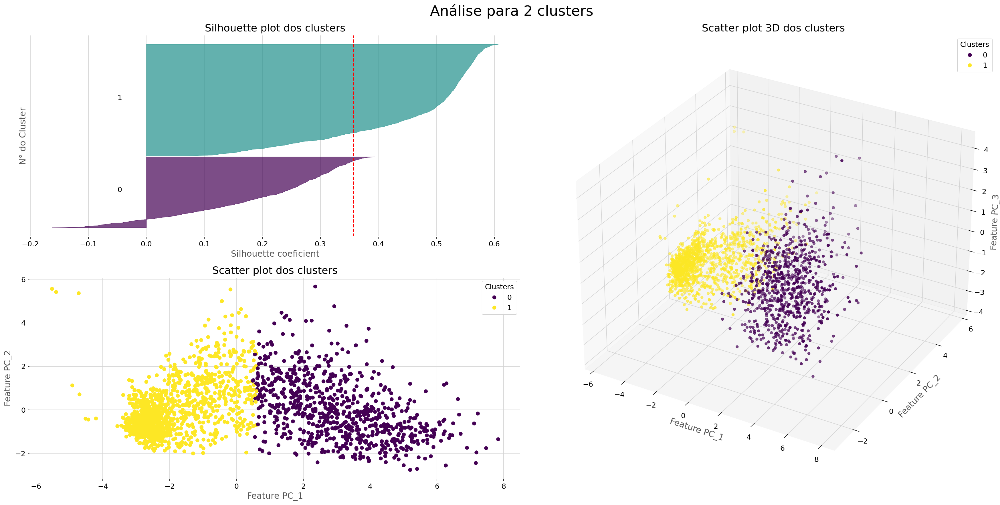

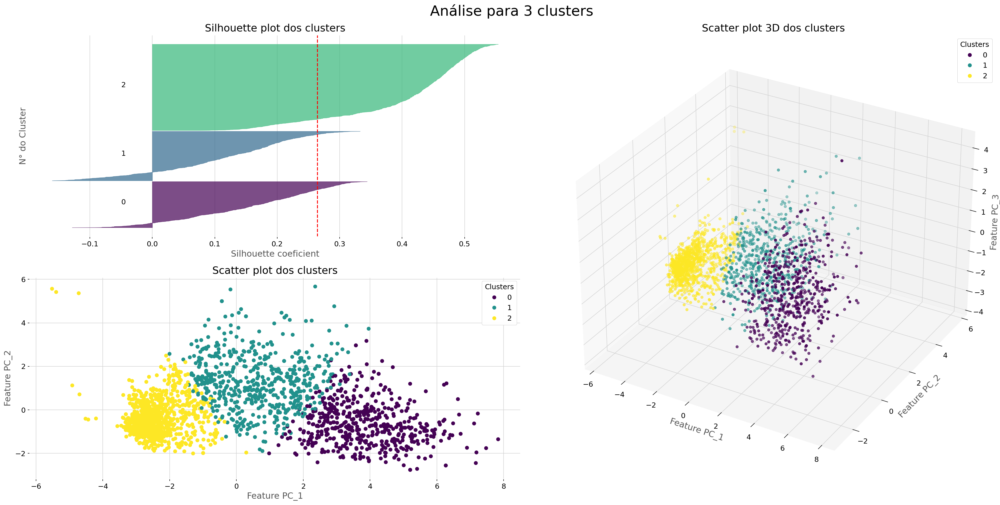

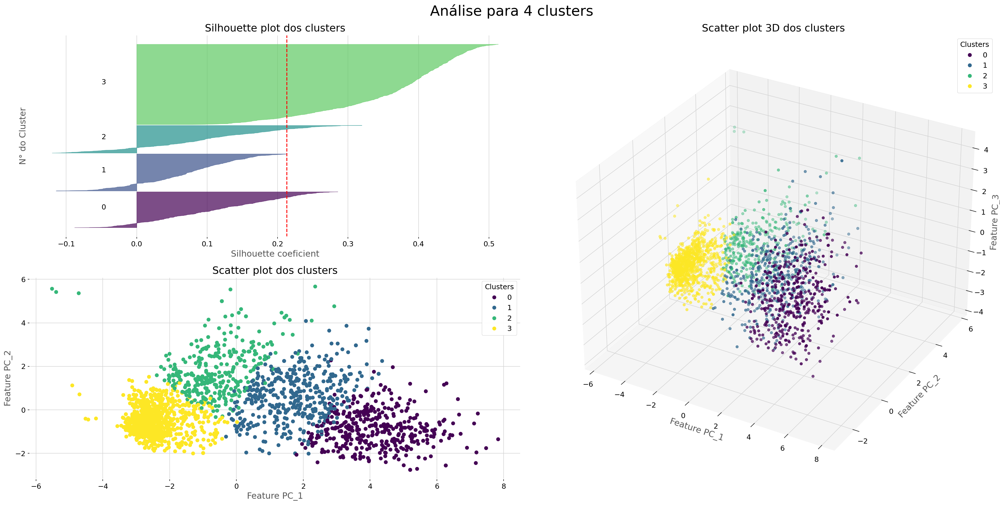

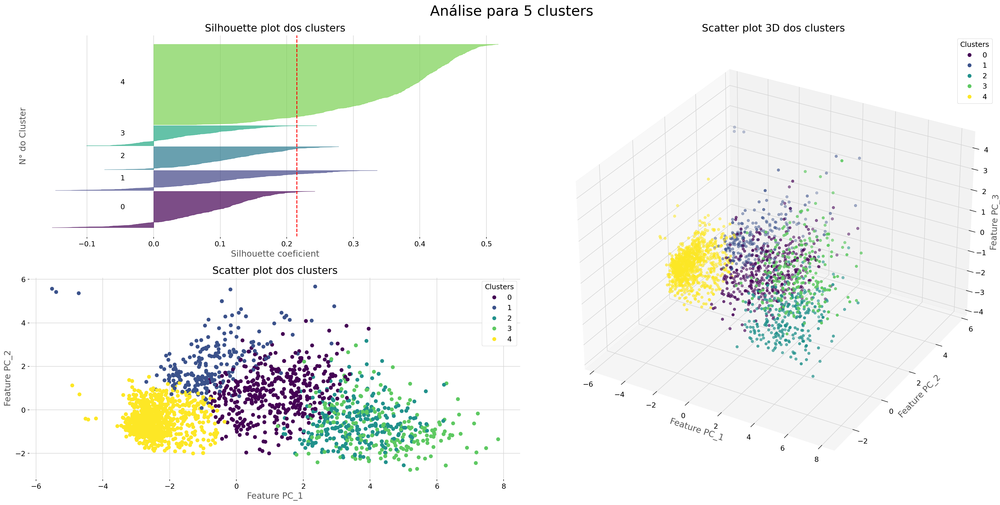

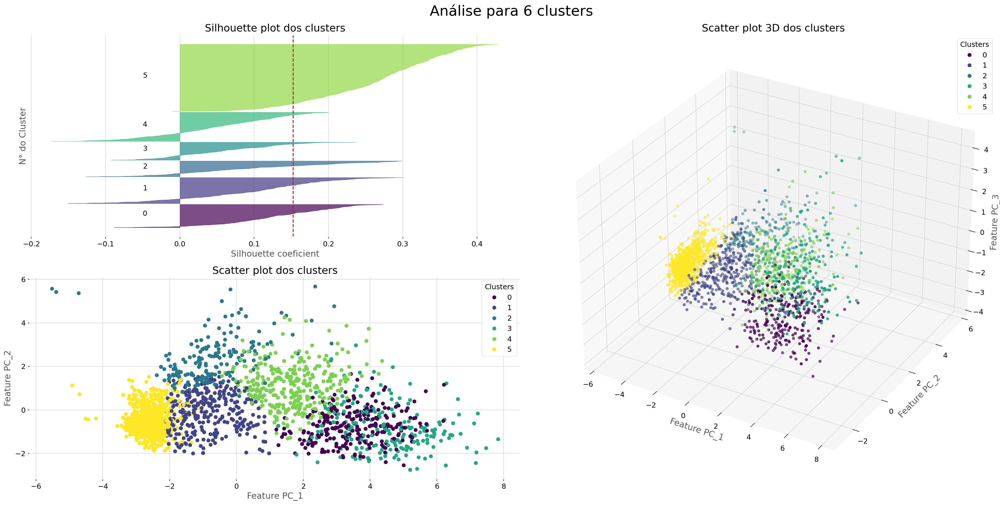

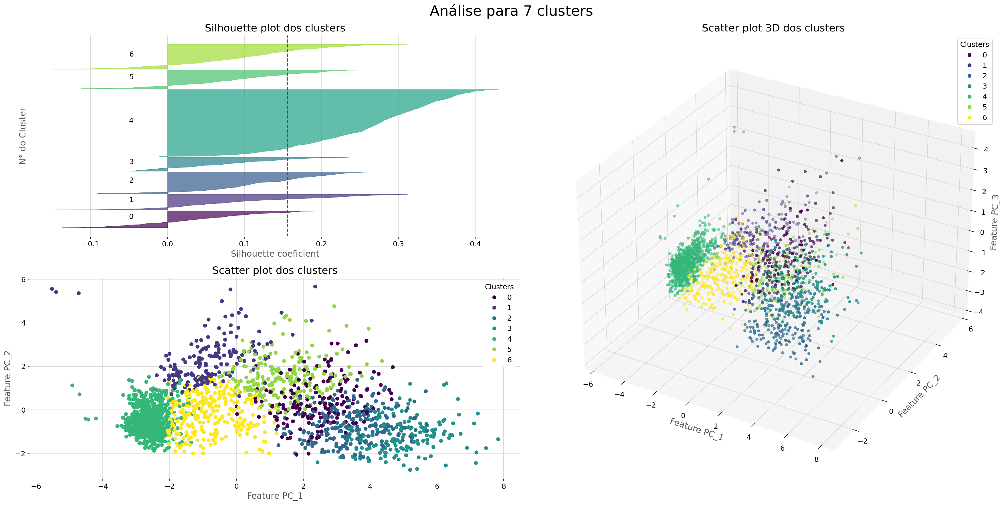

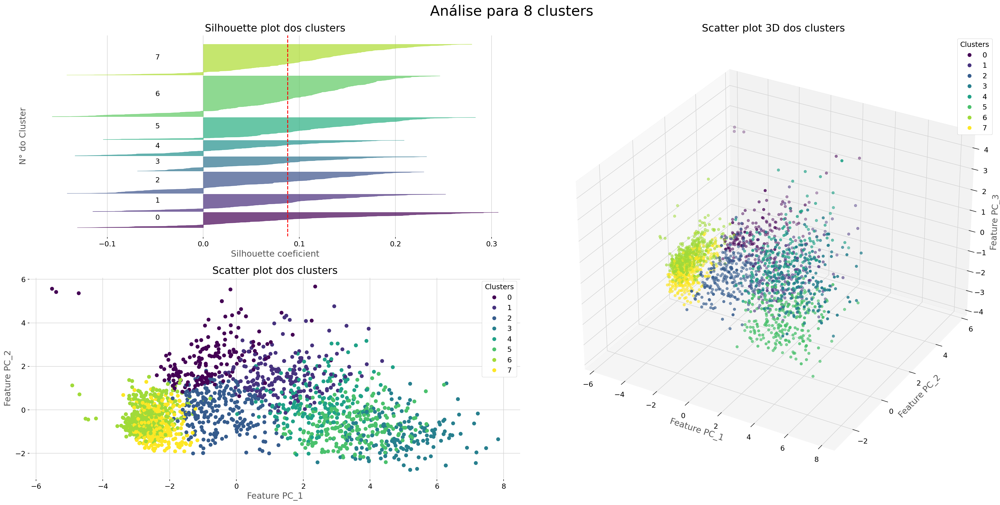

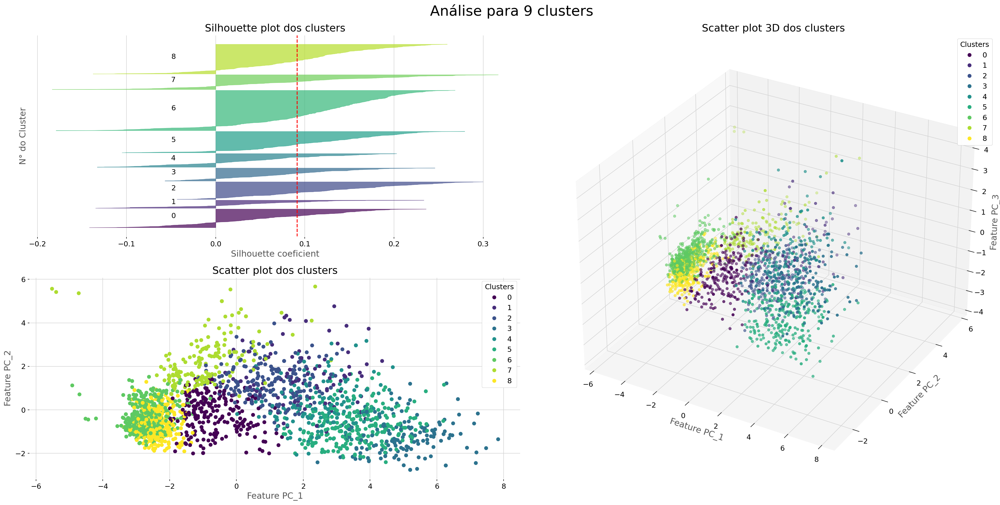

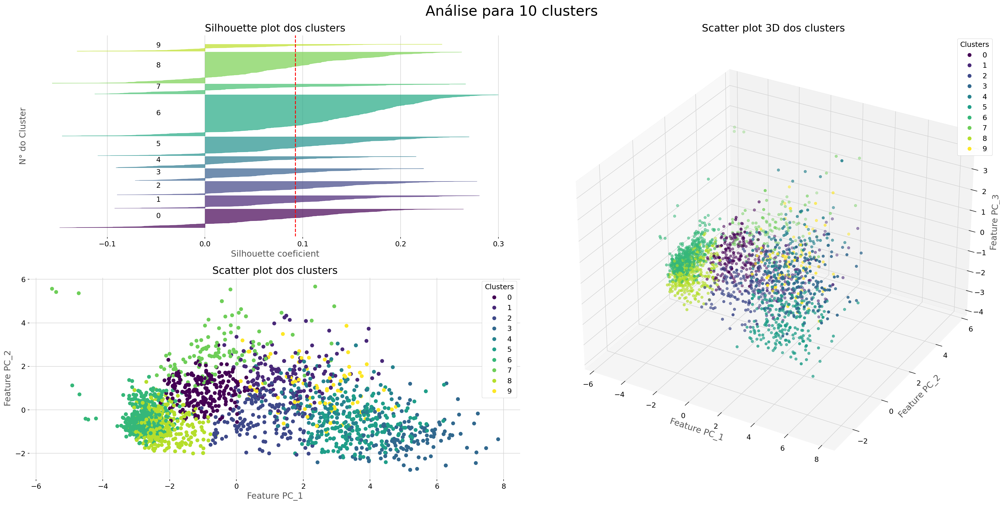

In [4]:
k_max = 10
path_scores = BASE_DIR + '\\data\\metrics\\Clusters_scores.csv'

silhouette_by_cluster,db_by_cluster,ch_by_cluster = silhouette_analysis(df_prepared,cat_relevant,k_max,
                                                                        save_path=path_scores,gamma=None)

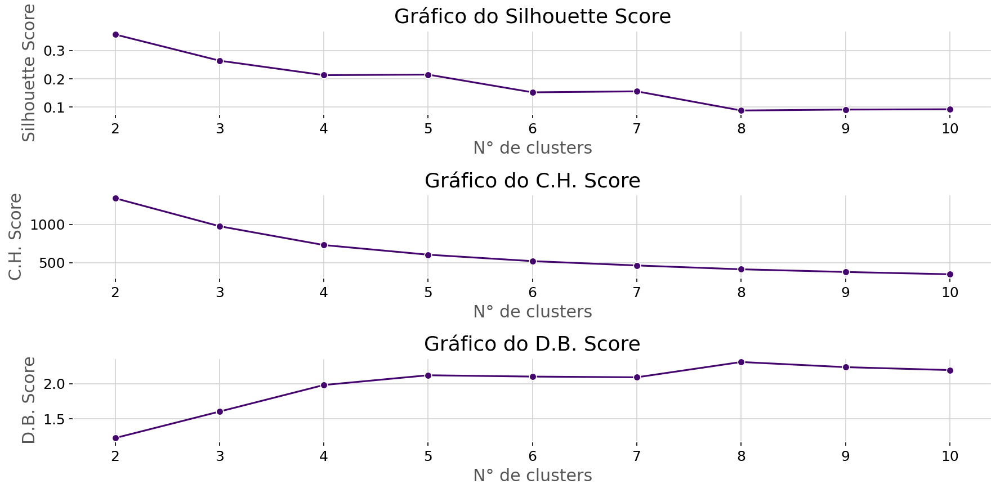

In [5]:
scores_plot(silhouette_by_cluster,ch_by_cluster,db_by_cluster)

**Condições para a escolha do número de clusters:**

1. Todos os clusters devem apresentar valores acima da média (linha vermelha) no gráfico de Shillouette.
    
2. Os clustes devem apresentar nenhuma, ou a menor quantidade de valores negativos para o coeficiente de Shillouette.>

3. Os clusters devem apresentar o maior valor possível da média de coeficiente de Shillouette.

4. Os clusters com menor sobreposição entre os gráficos de dispersão serão levados em consideração, porém não
    decisivos pois não há apenas 3 dimensões no conjunto de dados numéricos.

5. Os maiores valores no score de Calinski Harabasz.

6. Os menores valores no score de Davies Bouldin.

7. O número de clusters terá influência ponderada entre a sua quantidade e o quão valiosos os dados agrupados podem fornecer para tomadas de decisões.

# 8. Avaliando resultados

A quantidade de clusters foi escolhida pelo critério de eliminação com base nos fatores apresentados como condições anteriormente, em que o **número ideal de clusters** para o conjunto de dados apresentado é de **K = 2**, pois não há valores negativos no gráfico de Shillouette e seu valor médio é o maior. Contudo, apenas dois agrupamentos tornam a segmentação de clientes limitada, e com isso foram analisadas outros números de clusters:

* Para **K=3**:
    1. Possui o segundo maior Shillouette Score;
    2. Há baixa superposição entre os gráficos de dispersão.
* Para **K=5**:
    1. Pode fazer uma segmentação mais eficaz para isolando dados que ajudem a responder 
        determinados problemas específicos;
    2. Possui um superposição média entre os gráficos de dispersão.
***

Com isso foi escolhido um número de clusters sendo **K = 3** pois possui a 2° melhor posição entre todos os scores e é um número de agrupamentos em que é possível ampliar as opções durante o processo de tomada de decisões.

In [6]:
df_final,model = fit_pred_data(df_processed,df_prepared,3,cat_relevant)
df_final


,Education,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,Response,Promos_Total,Age,Dependants,Has_minor,Partner,House_members,Income_per_members,Total_spent,Clusters
0,Graduate,58138.0,0,0,2 Meses,635,88,546,172,88,...,1,0,Idosos,0,0,1,2,29069.000000,1617,0
1,Graduate,46344.0,1,1,2 Meses,11,1,6,2,1,...,0,0,Idosos,2,1,1,4,11586.000000,27,2
2,Graduate,71613.0,0,0,1 Mes,426,49,127,111,21,...,0,0,Meia-idade,0,0,1,2,35806.500000,776,1
3,Graduate,26646.0,1,0,1 Mes,11,4,20,10,3,...,0,0,Adultos,1,1,1,3,8882.000000,53,2
4,Postgraduate,58293.0,1,0,> 3 Meses,173,43,118,46,27,...,0,0,Adultos,1,1,0,2,29146.500000,422,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,Graduate,61223.0,0,1,2 Meses,709,43,182,42,118,...,0,0,Meia-idade,1,1,0,2,30611.500000,1341,1
2201,Postgraduate,64014.0,2,1,2 Meses,406,0,30,0,0,...,0,1,Idosos,3,1,1,5,12802.800000,444,1
2202,Graduate,56981.0,0,0,> 3 Meses,908,48,217,32,12,...,0,1,Adultos,0,0,0,1,56981.000000,1241,1
2203,Postgraduate,69245.0,0,1,1 Mes,428,30,214,80,30,...,0,0,Idosos,1,1,1,3,23081.666667,843,1


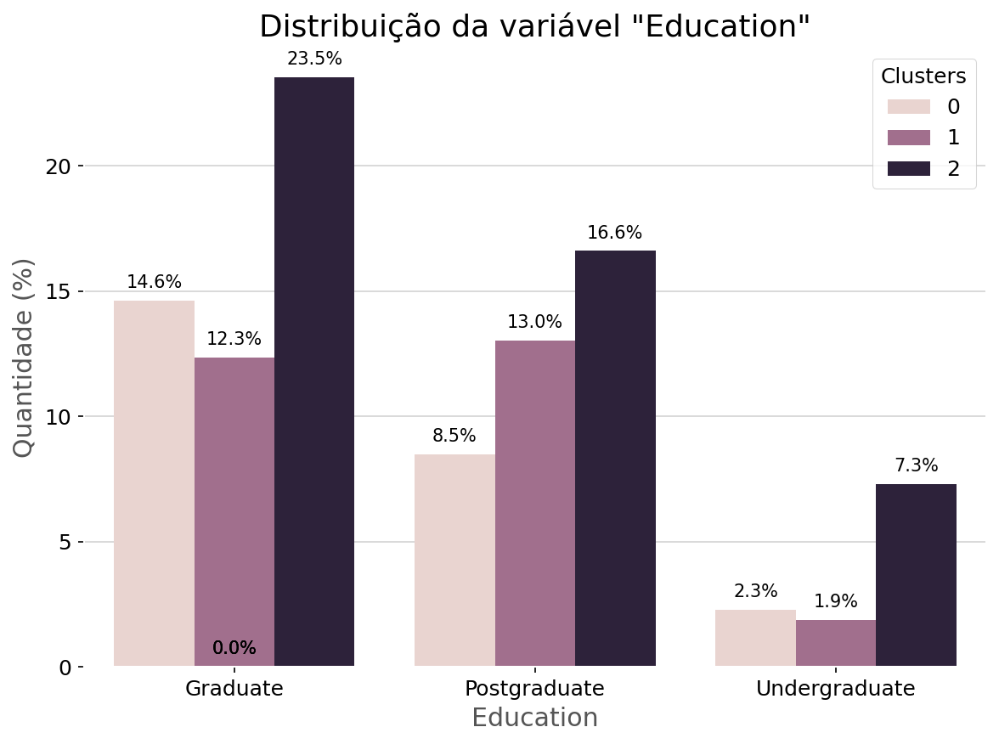

-----------------------------------------------------------------------------------------------------------------------------


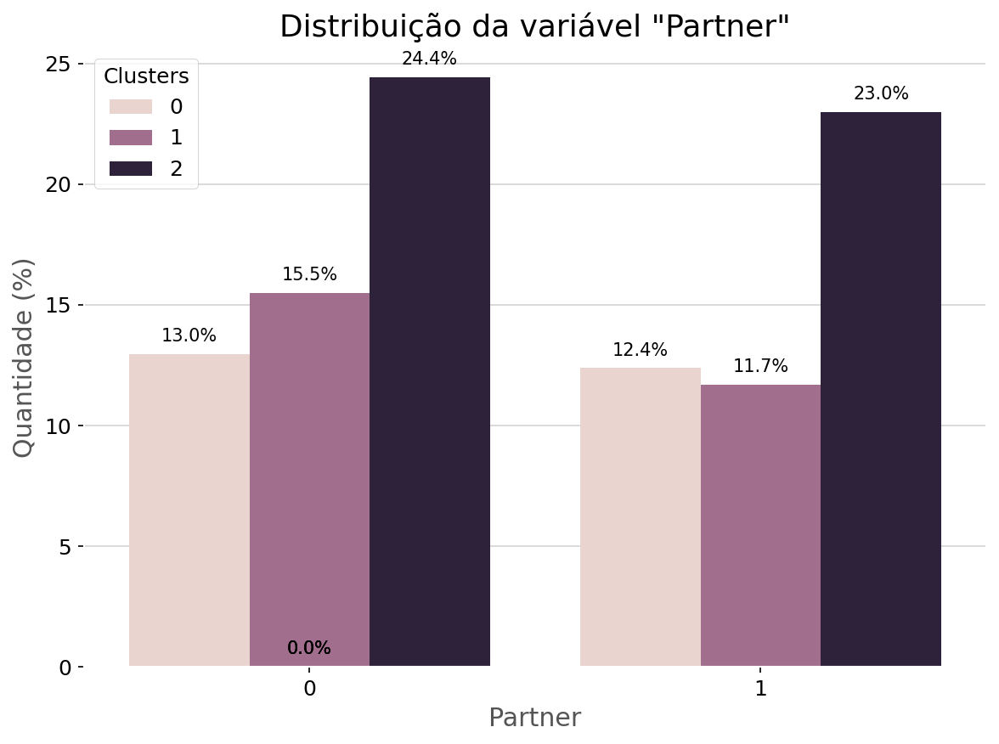

-----------------------------------------------------------------------------------------------------------------------------


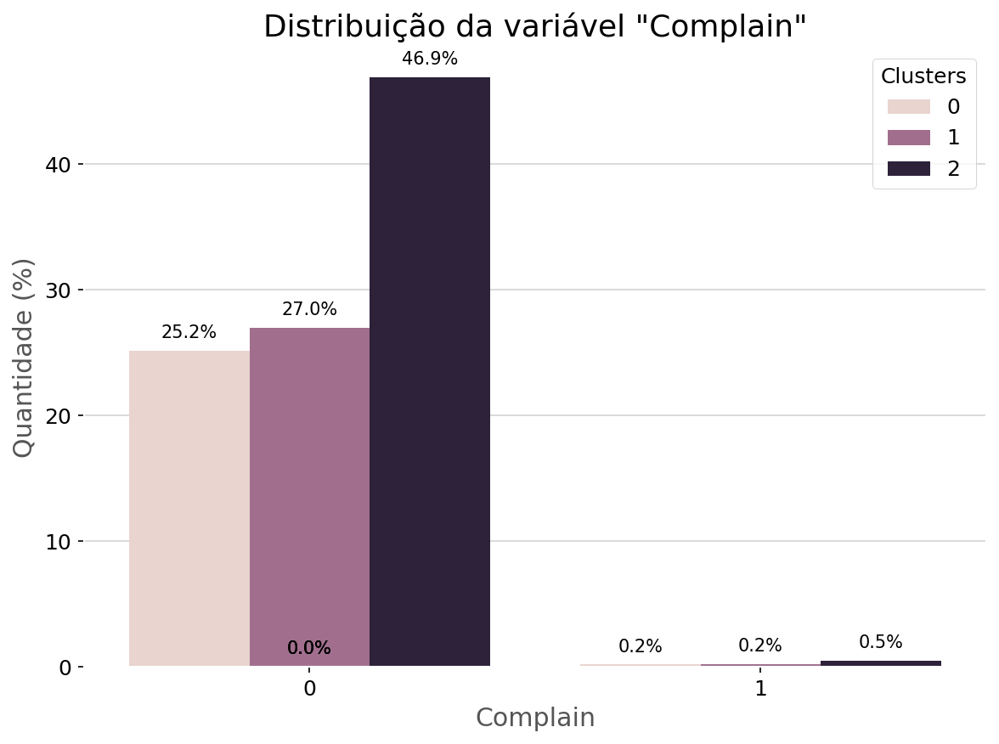

-----------------------------------------------------------------------------------------------------------------------------


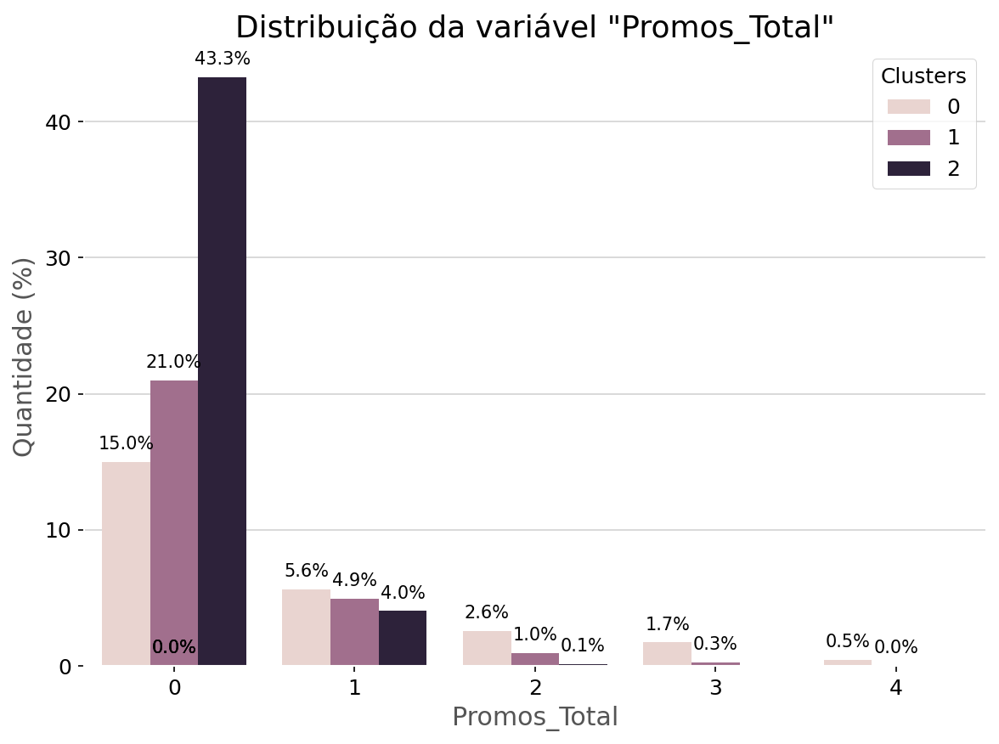

-----------------------------------------------------------------------------------------------------------------------------


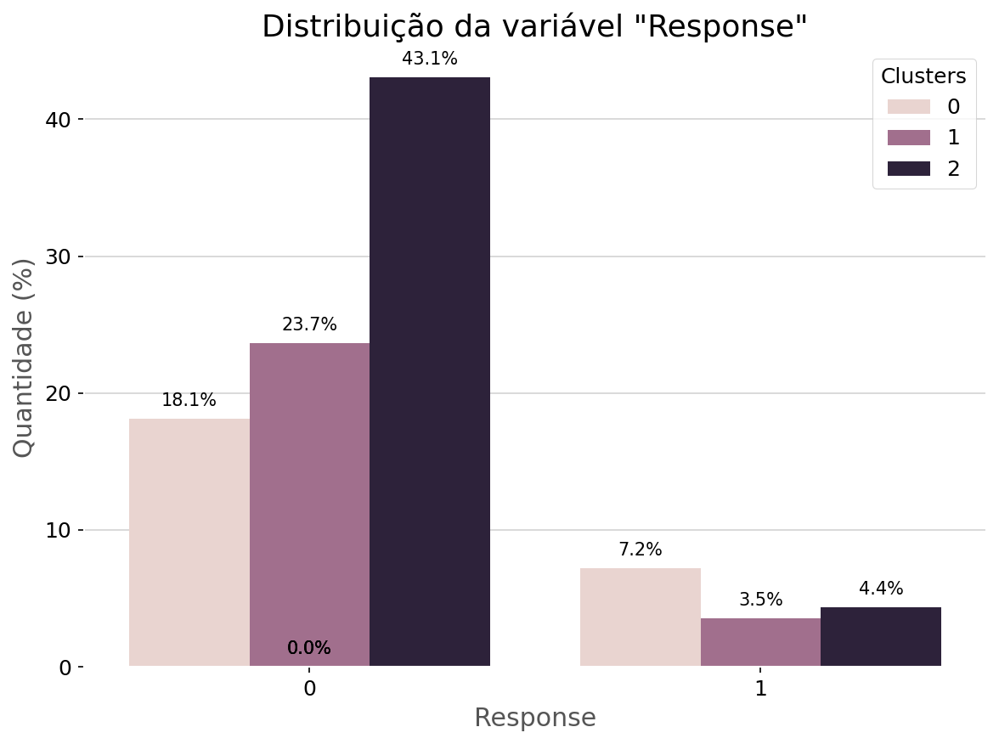

-----------------------------------------------------------------------------------------------------------------------------


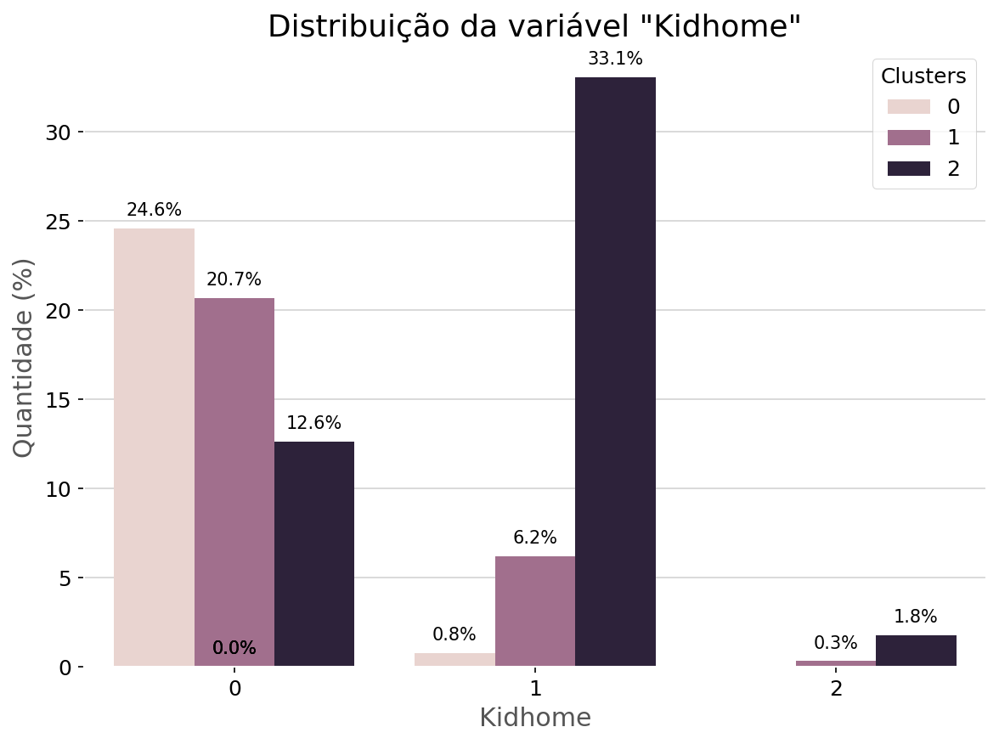

-----------------------------------------------------------------------------------------------------------------------------


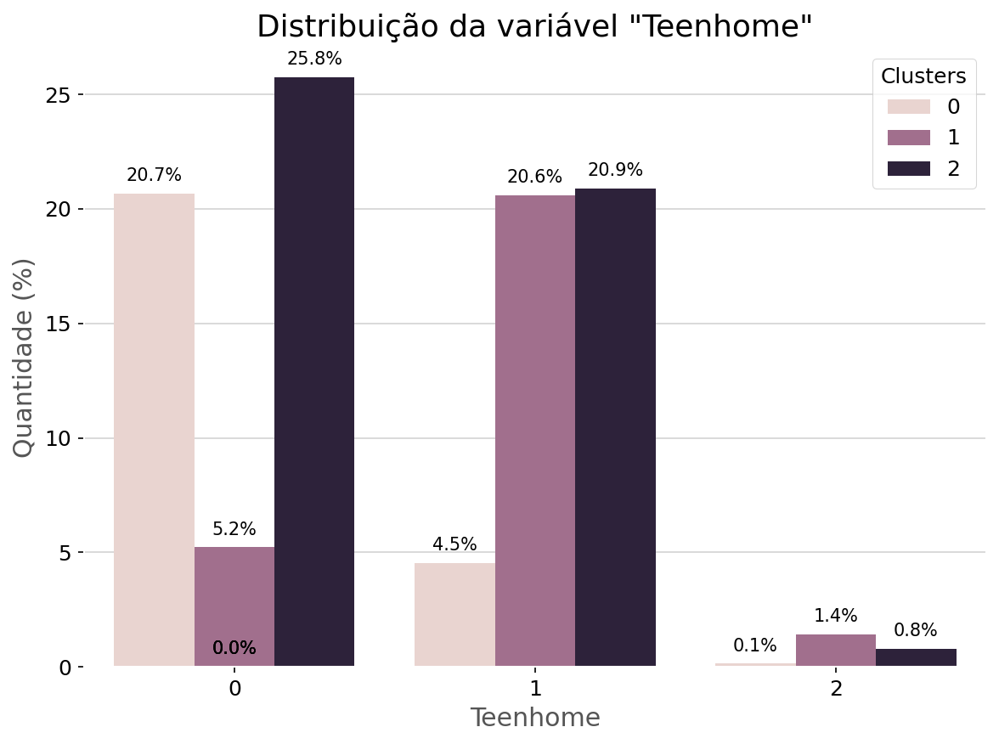

-----------------------------------------------------------------------------------------------------------------------------


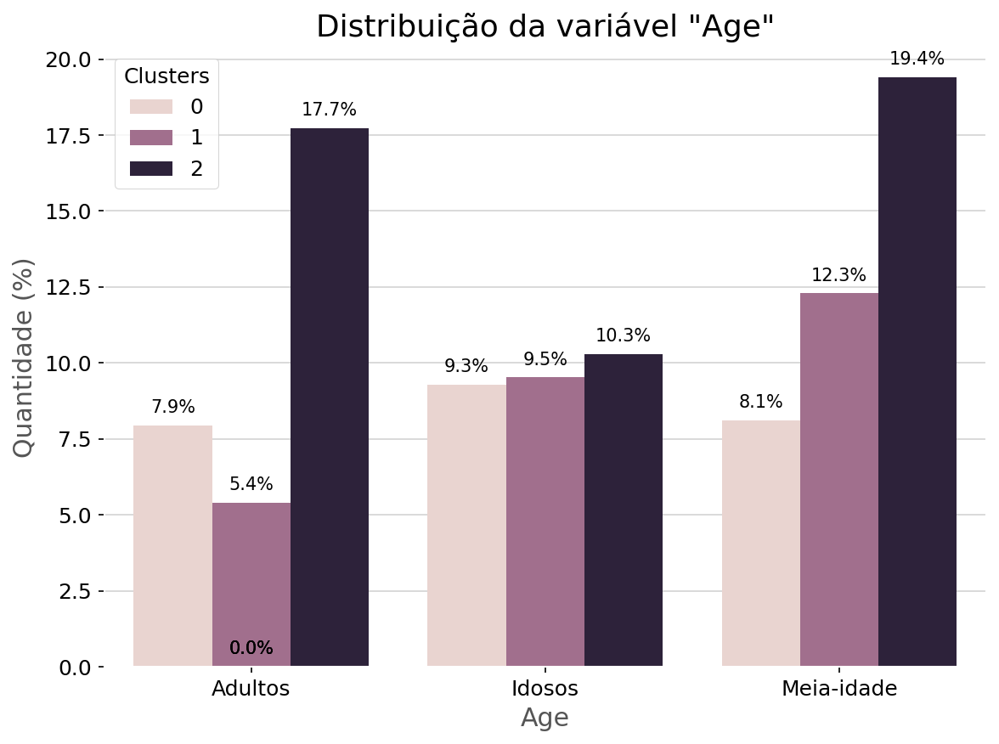

-----------------------------------------------------------------------------------------------------------------------------


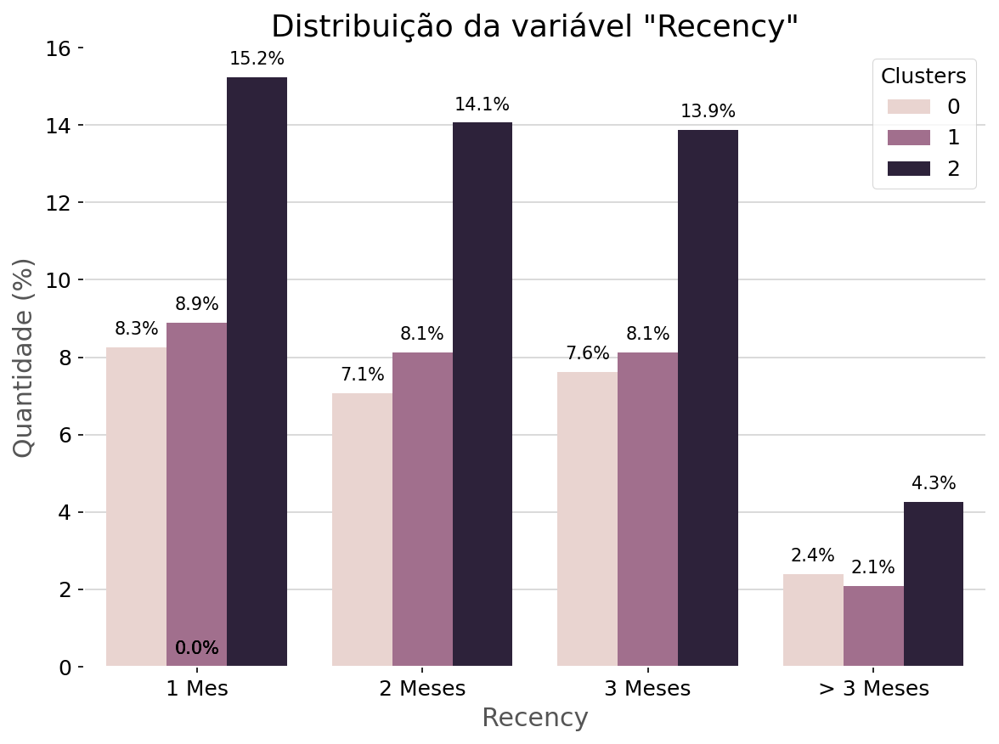

-----------------------------------------------------------------------------------------------------------------------------


In [7]:
lista_categoricas = ['Education','Partner','Complain','Promos_Total','Response','Kidhome', 'Teenhome','Age','Recency']
graph_categorical_clusters(df_final,lista_categoricas)


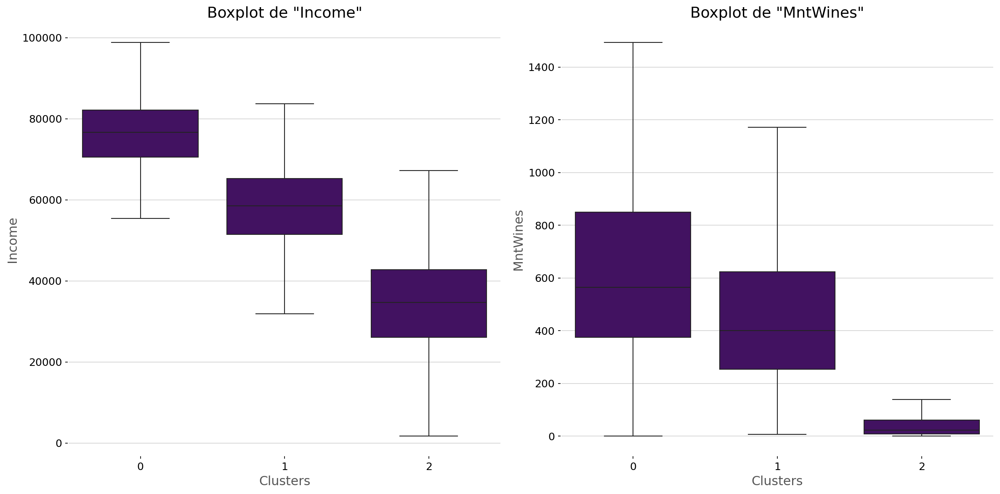

-----------------------------------------------------------------------------------------------------------------------------


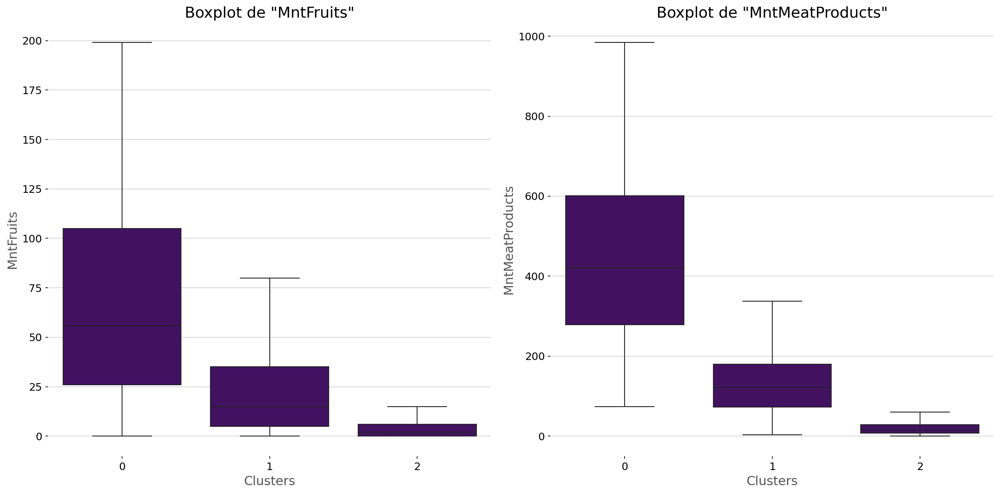

-----------------------------------------------------------------------------------------------------------------------------


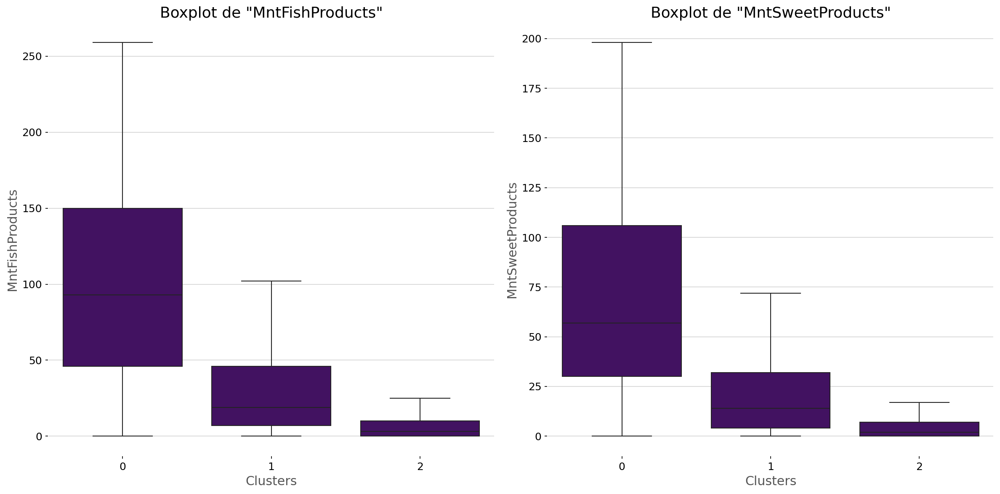

-----------------------------------------------------------------------------------------------------------------------------


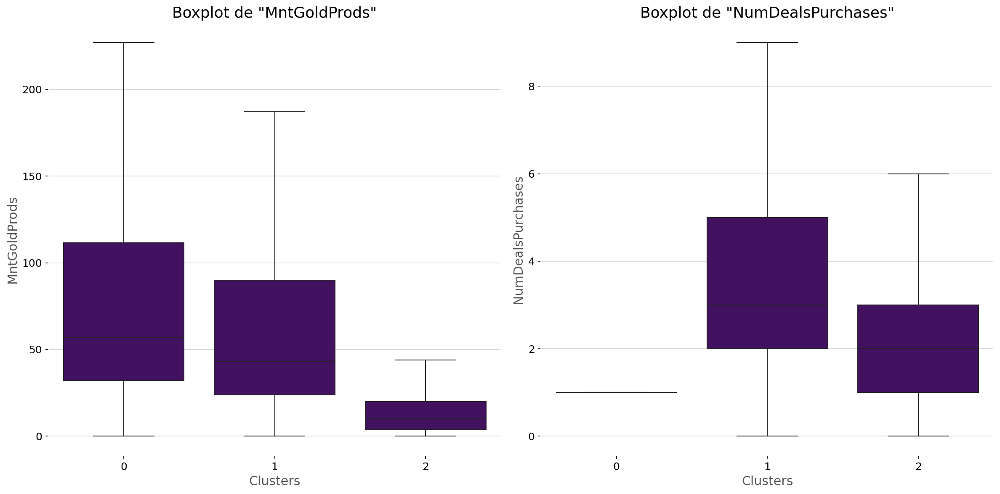

-----------------------------------------------------------------------------------------------------------------------------


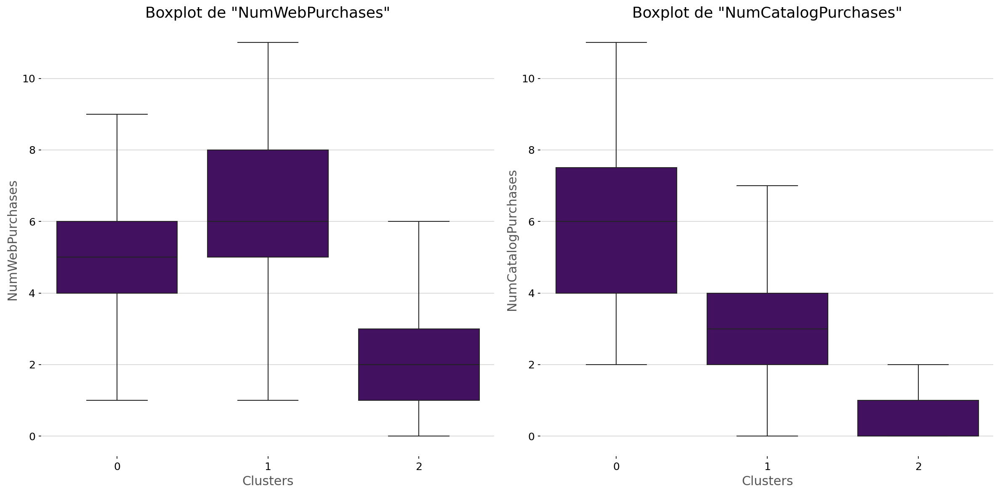

-----------------------------------------------------------------------------------------------------------------------------


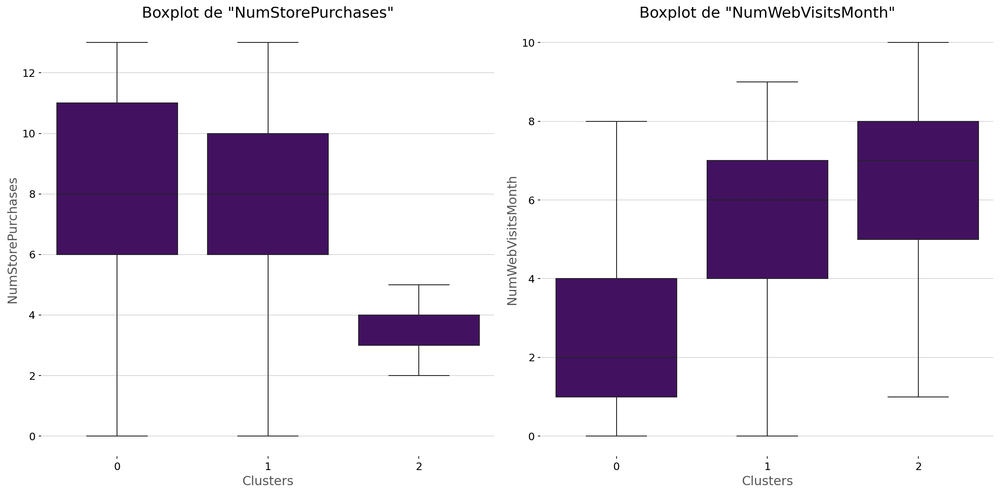

-----------------------------------------------------------------------------------------------------------------------------


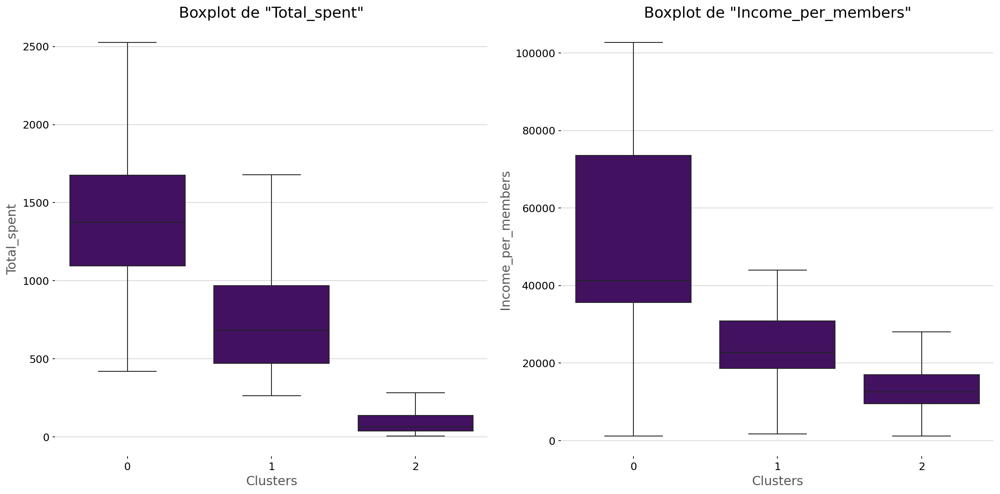

-----------------------------------------------------------------------------------------------------------------------------


In [8]:

lista_num = ['Income','MntWines','MntFruits','MntMeatProducts',
             'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
             'NumDealsPurchases', 'NumWebPurchases','NumCatalogPurchases',
             'NumStorePurchases', 'NumWebVisitsMonth','Total_spent','Income_per_members']

boxplot_clusters(df_final,lista_num)



**Análise dos clusters:**

* **Cluster 0:**
    * Não possuem mais de 1 criança
    * Baixas chances de possuírem mais de um adolescente
    na residência
    * Alta renda
    * Maior consumo de vinhos, frutas, carnes, doces e peixes
    * Consumos moderados de produtos que contém ouro
    * Cerca de apenas 1 compra feita em oferta
    * Agrupamento com maior número de compras feitas em catálogos
    * Menores números de acessos ao site no último mês
    * Alto consumo geral
    ***
* **Cluster 1:**
    * Renda média
    * Consumo de vinhos,frutas, carnes,doces e peixes de forma moderada/baixa
    * Consumos moderados de produtos que contém ouro
    * Maior número de compras feitas em ofertas
    *  Compras pela internet realizadas de forma moderada/alta
    * Médio consumo geral
    *** 
* **Cluster 2:**
   * Aceitam até 2 promoções, e a maioria dos clientes
   que não aceitam promoções compõem esse agurpamento.
   * A maioria não aceitaram a última oferta
   * Representa o agrupamento com maior chances de ter apenas uma criança
   * Renda média/baixa
   * Baixo consumo de vinho, frutas, carnes,doces e peixes
   * Menor número de compras pela internet
   * Número de compras feitas em catálogos é baixo
   * Baixo número de compras em lojas físicas
   * Maior número de acessos ao site no último mês
   * Baixo consumo geral
   ***


# Estratégias de marketing para os clusters

- <span style="background-color: blue; color: white; padding: 3px;">Cluster 0:</span>

  Perfil: Alta renda, alto consumo de produtos variados, preferem comprar através de catálogos, não respondem bem a ofertas e promoções, e têm baixo engajamento online.

  * <span style="background-color: green; color: white; padding: 3px;">Campanhas de Fidelização Premium:</span> Desenvolver programas de fidelidade exclusivos com foco em produtos de luxo, como vinhos de alta qualidade e produtos gourmet.
  * <span style="background-color: green; color: white; padding: 3px;">Marketing de Catálogos:</span> Continuar investindo em campanhas via catálogos, oferecendo uma experiência personalizada e visualmente atraente que destaque produtos premium.
  * <span style="background-color: green; color: white; padding: 3px;">Vendas Diretas e Personalizadas:</span> Oferecer atendimento personalizado, talvez com consultores dedicados que possam sugerir produtos com base no histórico de compras.
  * <span style="background-color: green; color: white; padding: 3px;">Lançamento de Produtos Exclusivos:</span> Oferecer lançamentos de produtos exclusivos, disponíveis apenas para esse cluster, talvez com eventos privados.

***

- <span style="background-color: blue; color: white; padding: 3px;">Cluster 1:</span>

  Perfil: Renda média, consumo moderado, mais propensos a comprar em promoções, e engajamento online moderado/alto.

  * <span style="background-color: green; color: white; padding: 3px;">Campanhas de Promoções:</span> Focar em campanhas de descontos e promoções sazonais para aumentar as vendas. Esse grupo é sensível a preços e responde bem a ofertas.
  * <span style="background-color: green; color: white; padding: 3px;">Ofertas Online:</span> Aproveitar o engajamento online para promover ofertas exclusivas para compras via internet, incentivando ainda mais o uso da plataforma digital.
  * <span style="background-color: green; color: white; padding: 3px;">Programa de Recompensas:</span> Introduzir um programa de recompensas baseado em compras frequentes, tanto online quanto em lojas físicas, para aumentar o valor de vida do cliente.

***

- <span style="background-color: blue; color: white; padding: 3px;">Cluster 2:</span>

  Perfil: Renda média/baixa, baixo consumo geral, engajamento online alto, menos receptivos a promoções.

  * <span style="background-color: green; color: white; padding: 3px;">Conteúdo Informativo Online:</span> Criar conteúdo educativo e informativo, como blogs ou webinars, para engajar esse grupo e fortalecer a marca. Focar em temas como economia doméstica, dicas de alimentação saudável, etc.
  * <span style="background-color: green; color: white; padding: 3px;">Ofertas de Valor:</span> Em vez de promoções, oferecer pacotes econômicos ou kits que agreguem valor, como combos de produtos essenciais com descontos modestos.
  * <span style="background-color: green; color: white; padding: 3px;">Melhoria na Experiência Digital:</span> Investir em melhorias na experiência online, já que esse grupo tem maior engajamento no site. Isso pode incluir uma navegação mais intuitiva, recomendações personalizadas, e promoções flash específicas para visitantes frequentes.


# Salvando modelos

In [9]:

path_final = f'{BASE_DIR}\\data\\clustered\\marketing_campaign_clustered.csv'
df_final.to_csv(path_final)

path_save_model = f'{BASE_DIR}\\data\\models'
name_file = 'kprototypes'
save_as_pickle(path_save_model,name_file,model)